In [1]:
import warnings
warnings.filterwarnings("ignore") 

In [2]:
!pip install -q openai

In [3]:
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import spacy
from matplotlib import pyplot as plt
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from openai import OpenAI
from plotly import express as px
from sklearn.cluster import AgglomerativeClustering, BisectingKMeans, DBSCAN, KMeans, MiniBatchKMeans
from sklearn.decomposition import LatentDirichletAllocation, PCA, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from umap import UMAP
from wordcloud import WordCloud

In [49]:
with open('/kaggle/input/apikey/apikey.txt', 'r') as key_file:
    api_key = key_file.read()

In [5]:
filepath = "/kaggle/input/consumer-review-of-clothing-product/Consumer Review of Clothing Product/data_amazon.xlsx - Sheet1.csv"

df = pd.read_csv(filepath)

display(df)

,Title,Review,Cons_rating,Cloth_class,Materials,Construction,Color,Finishing,Durability
0,NaN,Absolutely wonderful - silky and sexy and comf...,4.0,Intimates,0.0,0.0,0.0,1.0,0.0
1,NaN,Love this dress! it's sooo pretty. i happene...,5.0,Dresses,0.0,1.0,0.0,0.0,0.0
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,0.0,0.0,0.0,1.0,0.0
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,0.0,0.0,0.0,0.0,0.0
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,0.0,0.0,1.0,0.0,0.0
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,1.0,0.0,0.0,0.0,1.0
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,0.0,1.0,0.0,0.0,0.0
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0.0,0.0,0.0,0.0,1.0


In [6]:
nulls = pd.DataFrame(df.isnull().sum(), columns = ['Nulls'])

display(nulls.T)

,Title,Review,Cons_rating,Cloth_class,Materials,Construction,Color,Finishing,Durability
Nulls,3968,831,214,16,43597,43595,43596,43601,43604


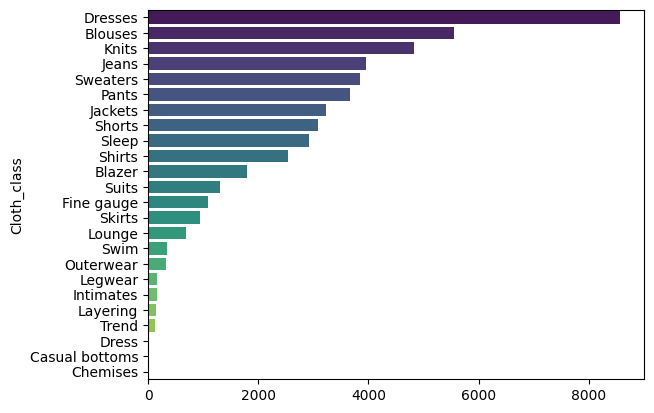

In [7]:
classes = df['Cloth_class'].value_counts()

sns.barplot(y = classes.index, x = classes.values, palette = 'viridis', orient = 'h')

plt.show()

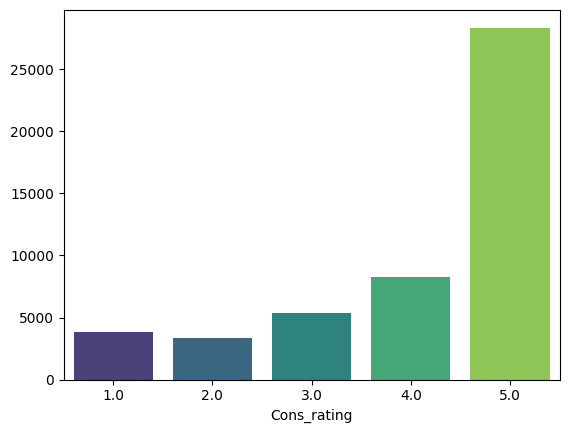

In [8]:
ratings = df['Cons_rating'].value_counts()

sns.barplot(x = ratings.index, y = ratings.values, palette = 'viridis')

plt.show()

In [9]:
clean_df = df.dropna(subset = ['Title', 'Review', 'Cloth_class']).drop(columns = ['Materials', 'Construction', 'Color', 'Finishing', 'Durability'])

display(clean_df)

,Title,Review,Cons_rating,Cloth_class
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits
...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses


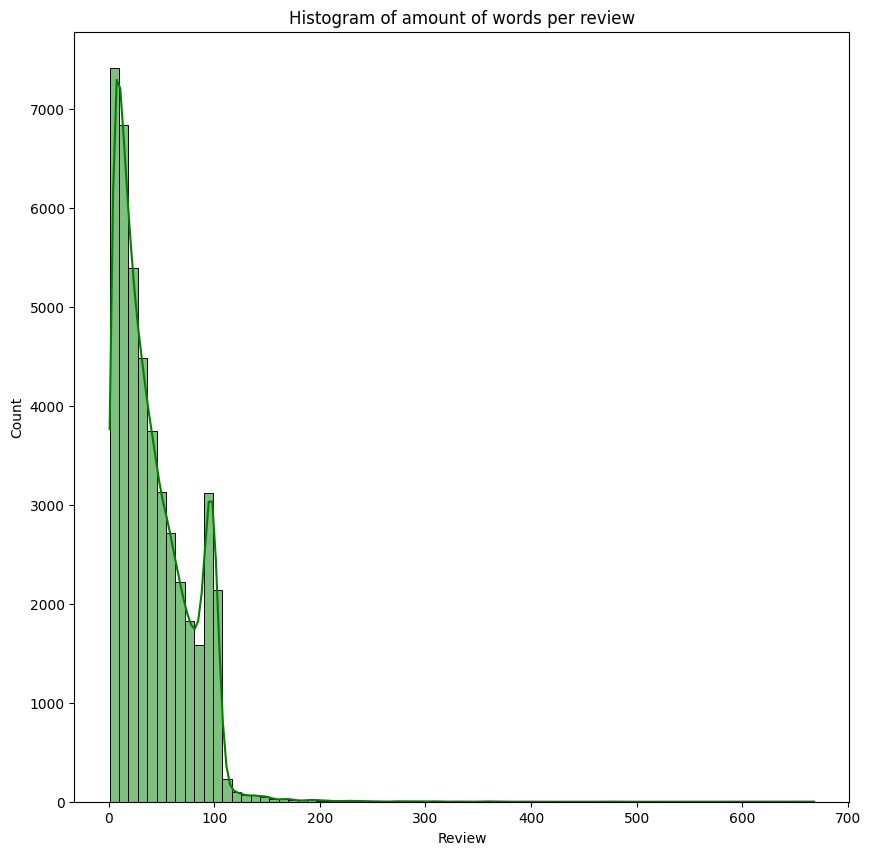

In [10]:
fig, ax = plt.subplots(figsize = (10, 10))

words_per_review = clean_df['Review'].apply(lambda x: len(x.split()))

sns.histplot(words_per_review, kde = True, bins = 75, color = 'Green').set_title(f'Histogram of amount of words per review')

plt.show()

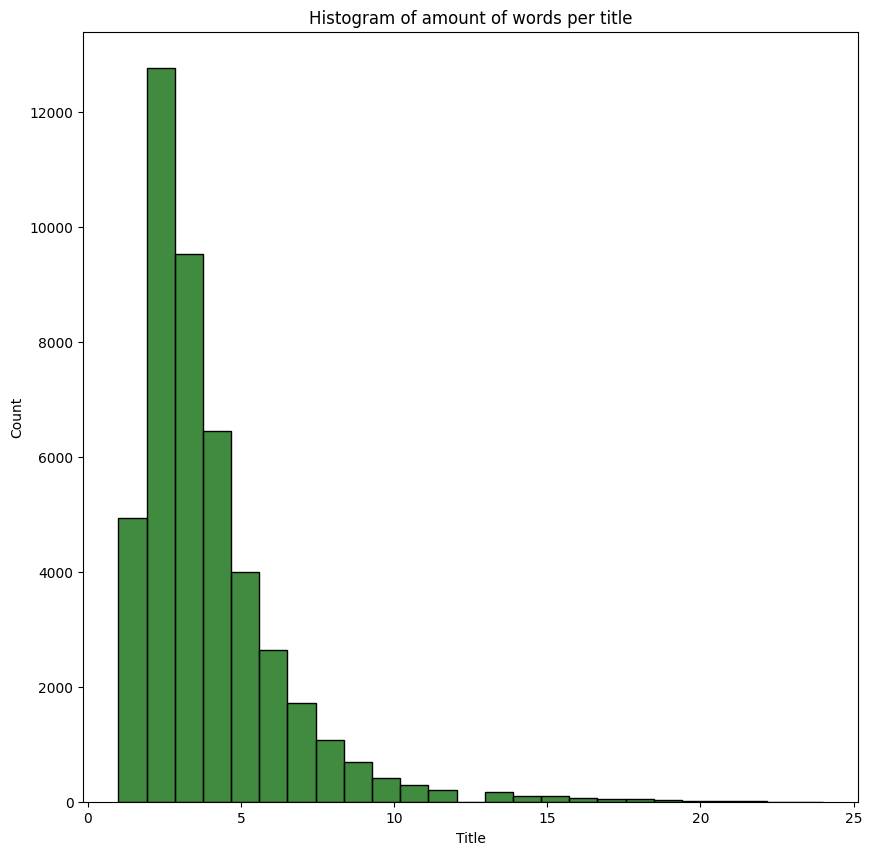

In [11]:
fig, ax = plt.subplots(figsize = (10, 10))

words_per_title = clean_df['Title'].apply(lambda x: len(x.split()))

sns.histplot(words_per_title, bins = 25, color = 'DarkGreen').set_title(f'Histogram of amount of words per title')

plt.show()

In [12]:
word_features = clean_df['Review'] 

In [13]:
!python -m spacy download en_core_web_sm | grep -v 'Requirement already satisfied'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 85.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [14]:
nlp = spacy.load('en_core_web_sm')

In [15]:
def plot_words_similarity(matrix, under_threshold, over_threshold):
    fig, ax = plt.subplots(figsize = (10, 10))
    
    sns.heatmap(matrix, 
                cmap = 'viridis', 
                xticklabels = over_threshold, 
                yticklabels = under_threshold,
                annot = True
               ).set(xlabel = 'Classes over threshold', ylabel = 'Classes under threshold')
    
    plt.show()
    
def word_similarity_replacer(cloth_class, max_similarities, min_replacer = 0.5):
    under_threshold = set(max_similarities.keys())
    
    def replacer(x):
        if x not in under_threshold or max_similarities[x][1] < min_replacer: return x
        else: return max_similarities[x][0] 
    
    return cloth_class.apply(replacer)

In [16]:
stemmer = SnowballStemmer('english')

lemmatizer = WordNetLemmatizer()

In [19]:
threshold = 1500

classes_list_over = list(classes[classes.values >= threshold].index)
classes_list_under = list(classes[classes.values < threshold].index)

classes_list_over.sort()
classes_list_under.sort()

matrix = list()
max_similarities = dict()

for under in classes_list_under:
    under_stem = stemmer.stem(under)
    
    under_token = nlp(under_stem)
    
    row = list()
    
    max_sim = float('-inf')
    max_sim_token = ''
    
    for over in classes_list_over:
        over_stem = stemmer.stem(over)
        
        over_token = nlp(over_stem)
        
        similarity = under_token.similarity(over_token)
        
        if similarity > max_sim:
            max_sim = similarity 
            max_sim_token = over
        
        row.append(similarity)
        
    matrix.append(row)
    max_similarities[under] = (max_sim_token, max_sim)

In [20]:
for key, val in max_similarities.items():
    print(f'{key}: {val[0]} ({val[1]:.2f})')

Casual bottoms: Shorts (0.54)
Chemises: Sleep (0.68)
Dress: Dresses (1.00)
Fine gauge: Pants (0.60)
Intimates: Sweaters (0.70)
Layering: Jackets (0.75)
Legwear: Pants (0.69)
Lounge: Pants (0.61)
Outerwear: Jeans (0.54)
Skirts: Dresses (0.78)
Suits: Jackets (0.76)
Swim: Dresses (0.70)
Trend: Jackets (0.79)


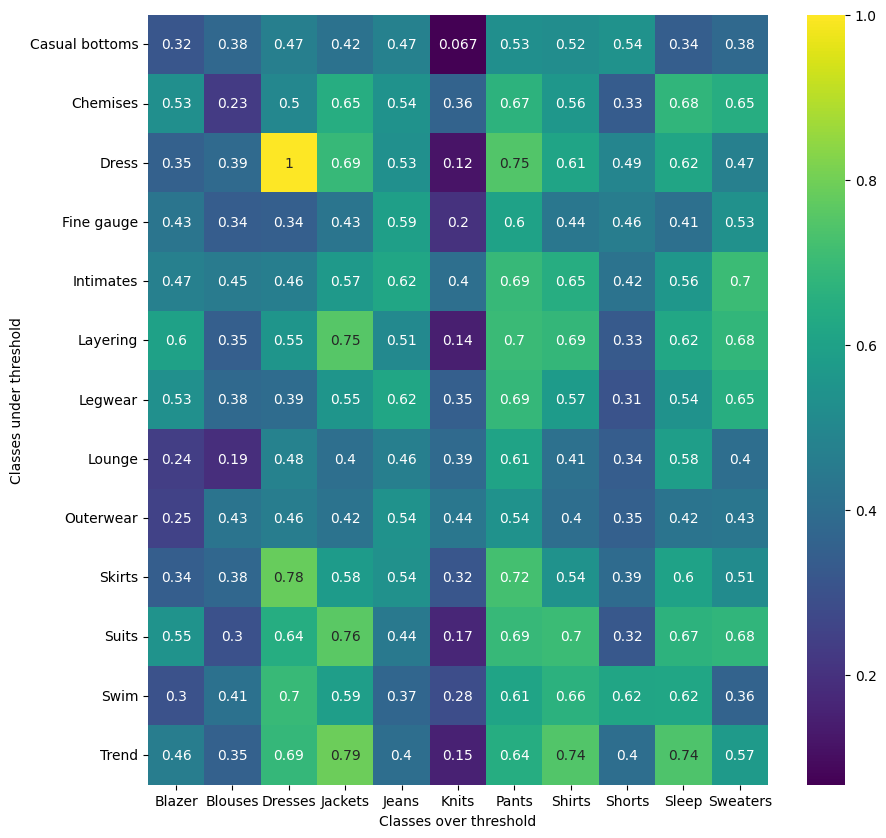

In [21]:
plot_words_similarity(matrix, classes_list_under, classes_list_over)

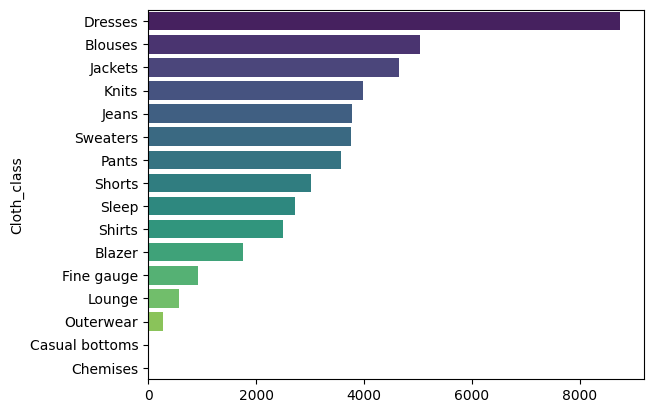

In [22]:
new_df = clean_df.copy()

new_df['Cloth_class'] = word_similarity_replacer(clean_df['Cloth_class'], max_similarities, min_replacer = 0.68)

new_classes = new_df['Cloth_class'].value_counts()

sns.barplot(x = new_classes.values, y = new_classes.index, palette = 'viridis', orient = 'h')

plt.show()

In [23]:
def text_feature_extract(text_feature, model):
    text = model.fit_transform(text_feature)
        
    return text

In [130]:
def cluster_results(cluster_model, text, df):
    cluster_model.fit(text)
    
    model_df = df.copy()
    
    model_df['cluster'] = cluster_model.labels_
    
    total_cluster = model_df['cluster'].value_counts()
    
    model_cloth = pd.DataFrame(model_df.groupby(['cluster', 'Cloth_class'])[['cluster', 'Cloth_class']].value_counts()).reset_index().sort_values(by = 'Cloth_class')
    
    return model_df, total_cluster, model_cloth

def plot_total_cluster(total_cluster):
    sns.barplot(x = total_cluster.index, y = total_cluster.values, palette = 'viridis')
    
    plt.show()

def plot_cloth_cluster(model_cloth):
    unique_classes = model_cloth['Cloth_class'].unique()
    n_unique = len(unique_classes)
            
    fig, axes = plt.subplots((n_unique - 1) // 4 + 1, 4, figsize = (32, 30))

    for idx, cloth in enumerate(unique_classes):
        df_cluster_n = model_cloth[model_cloth['Cloth_class'] == cloth]

        sns.barplot(
                    y = df_cluster_n['cluster'], 
                    x = df_cluster_n['count'], 
                    orient = 'h', 
                    ax = axes[idx // 4][idx % 4],
                    palette = 'viridis'
                   ).set_title(f"{cloth}")
    
    if (n_unique % 4):
        for i in range(idx + 1, n_unique + (4 - n_unique % 4)):
            fig.delaxes(axes[i // 4][i % 4])

    plt.show()
    
def get_cluster_class(model_cloth):
    clusters = model_cloth['cluster'].unique()
    cluster_dict = {i: {'classes': list()} for i in clusters}
                    
    cloth_classes = model_cloth['Cloth_class'].unique()
        
    for cloth_class in cloth_classes:
        class_df = model_cloth[model_cloth['Cloth_class'] == cloth_class]
        
        max_of_class = class_df['count'].max()
        
        cluster_max = (class_df.query(f'count == {max_of_class}')['cluster'].iloc[0])
                        
        cluster_dict[cluster_max]['classes'].append(cloth_class)
    
    for cluster in clusters:
        classes = cluster_dict[cluster]['classes']
        
        n_cluster_df = model_cloth.query(f'cluster == {cluster}')
                
        sum_of_cluster = n_cluster_df['count'].sum()

        if classes:             
            n_cluster_df = n_cluster_df[n_cluster_df['Cloth_class'].isin(classes)]
            
            max_of_cluster = n_cluster_df['count'].max()
                    
            cluster_dict[cluster]['max'] = n_cluster_df.query(f'count == {max_of_cluster}')['Cloth_class'].values[0]
        
        cluster_dict[cluster]['count'] = sum_of_cluster
                
    return cluster_dict

def plot_cluster_class(cluster_dict):    
    x_axis = list(cluster_dict.keys())
    y_axis = list(map(lambda x: len(cluster_dict[x]['classes']), x_axis))
    
    sns.barplot(x = x_axis, y = y_axis, palette = 'viridis')
    
    plt.show()
    
def get_replacer_class(cluster_dict, classes_under_threshold, cloth_cluster):
    clusters = list(cluster_dict.keys())
        
    map_replacer = dict()
    
    classes = cloth_cluster['Cloth_class'].unique()
    
    classes_under_threshold = list(filter(lambda x: x in classes, classes_under_threshold))
    
    for under in classes_under_threshold:        
        not_in_cluster = True
        count = 0
        
        while not_in_cluster:            
            cluster = clusters[count]
                        
            if under in cluster_dict[cluster]['classes']:
                max_cluster = cluster_dict[cluster]['max']
                
                if max_cluster not in classes_under_threshold:
                    map_replacer[under] = max_cluster
                
                not_in_cluster = False
            
            count += 1
            
        map_replacer[under] = map_replacer.get(under) or '-'
        
    return map_replacer

In [25]:
words = "".join(word for word in word_features.values)

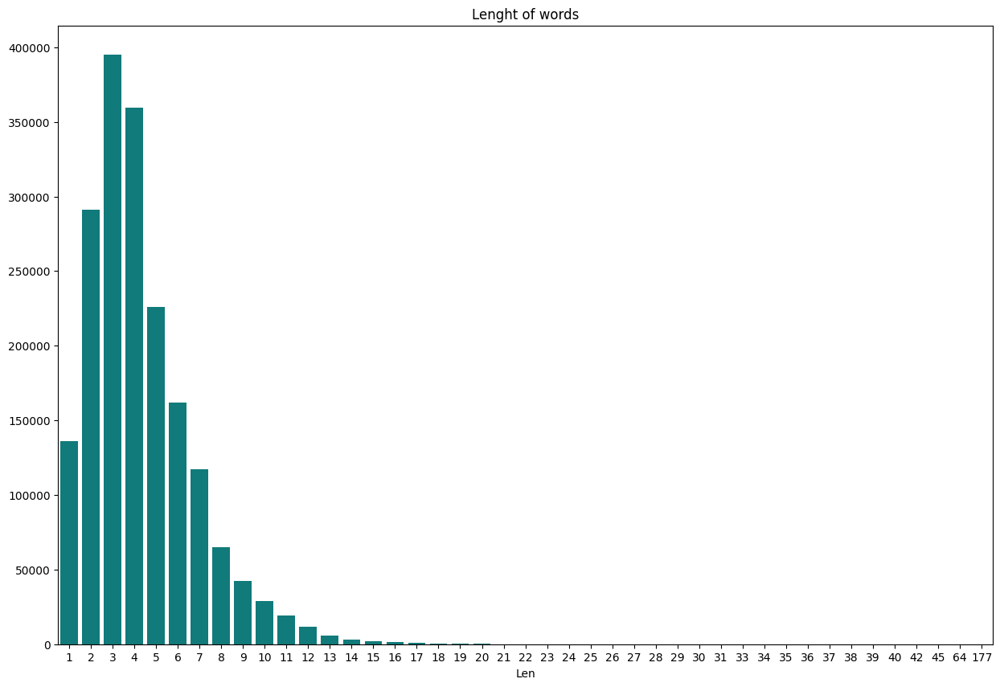

In [26]:
fig, ax = plt.subplots(figsize = (15, 10))

len_of_words = pd.DataFrame(map(lambda x: len(x), words.split()), columns = ['Len'])

len_of_words = len_of_words.groupby(['Len'])[['Len']].value_counts()

sns.barplot(x = len_of_words.index, y = len_of_words.values, color = 'DarkCyan', ax = ax).set_title("Lenght of words")

plt.show()

In [27]:
len_of_words_df = pd.DataFrame({'Word': words.split(), 'Len': map(lambda x: len(x), words.split())}).drop_duplicates()

display(len_of_words_df.sort_values(by = 'Len', ascending = False))

,Word,Len
1201633,<https://www.amazon.com/Womens-Casual-Office-B...,177
1486787,https://smile.amazon.com/gp/chpf/about/ref=smi...,64
134035,5&amp;amp;amp;amp;#39;8&amp;amp;amp;amp;quot;,45
1602493,mass-produced-men's-synthetic-fabric-clothing,45
1334442,restaurantPerfect...lightweight...comfyGot,42
...,...,...
4078,4,1
1270290,V,1
2959,2,1
4065,6,1


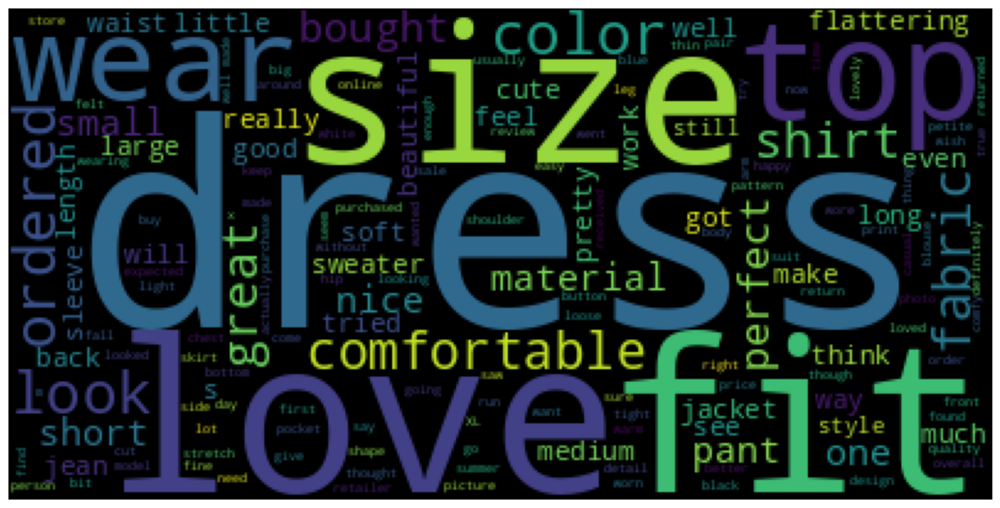

In [28]:
fig, ax = plt.subplots(figsize = (15, 15))

word_cloud = WordCloud(background_color = 'black').generate(words)

plt.imshow(word_cloud)
plt.axis("off")
plt.show()

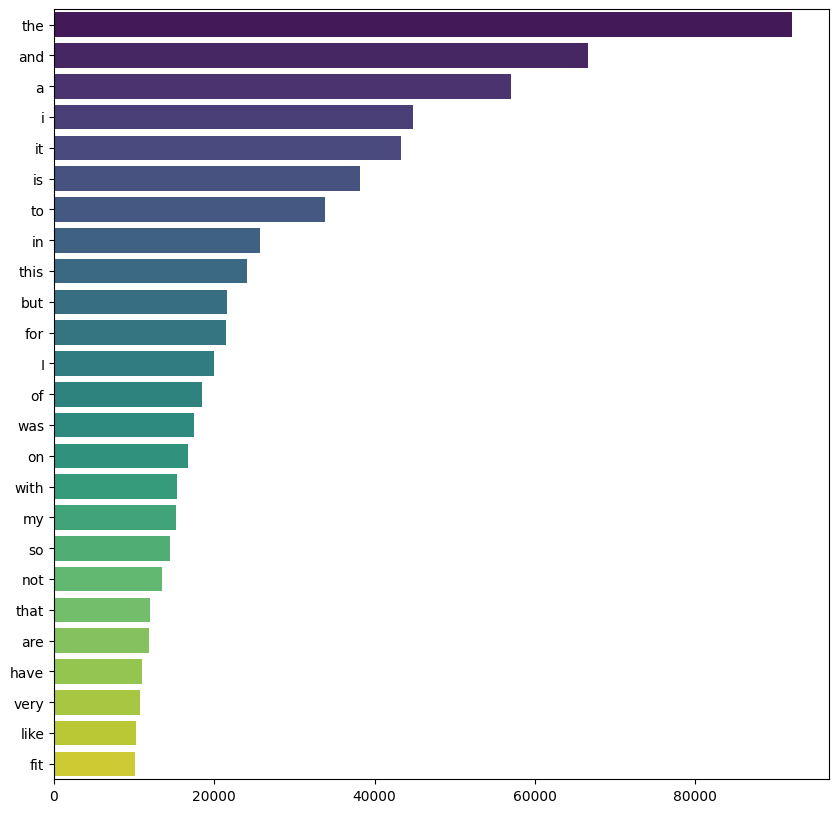

In [29]:
words_qtd = dict()

for word in words.split():
    if word in words_qtd.keys():
        words_qtd[word] += 1
    else:
        words_qtd[word] = 1
        
most_frequent = list(zip(words_qtd.keys(), words_qtd.values()))

most_frequent.sort(key = lambda x: x[1], reverse = True)

n_freq = 25

fig, ax = plt.subplots(figsize = (10, 10))

sns.barplot(x = [x[1] for x in most_frequent][:n_freq], 
            y = [x[0] for x in most_frequent][:n_freq], 
            palette = 'viridis',
            orient = 'h'
           )

plt.show()

In [30]:
languages = {'english', 'spanish', 'portuguese', 'italian'}

stopwords = list()

for lang in languages:
    stopwords.extend(nltk.corpus.stopwords.words(lang))

In [31]:
stemmed = word_features.str.split().apply(lambda x: [stemmer.stem(y) for y in x])

stemmed = stemmed.apply(lambda x: ' '.join(x))

In [32]:
count_vect0 = CountVectorizer(stop_words = stopwords, min_df = 4, max_df = 8000, ngram_range = (1, 2))

In [33]:
text_all = text_feature_extract(stemmed, count_vect0)

print(f"Number of words = {len(count_vect0.get_feature_names_out())}")

Number of words = 43833


In [34]:
lda = LatentDirichletAllocation(n_components = 12, n_jobs = 4, random_state = 1)

topics = lda.fit_transform(text_all)

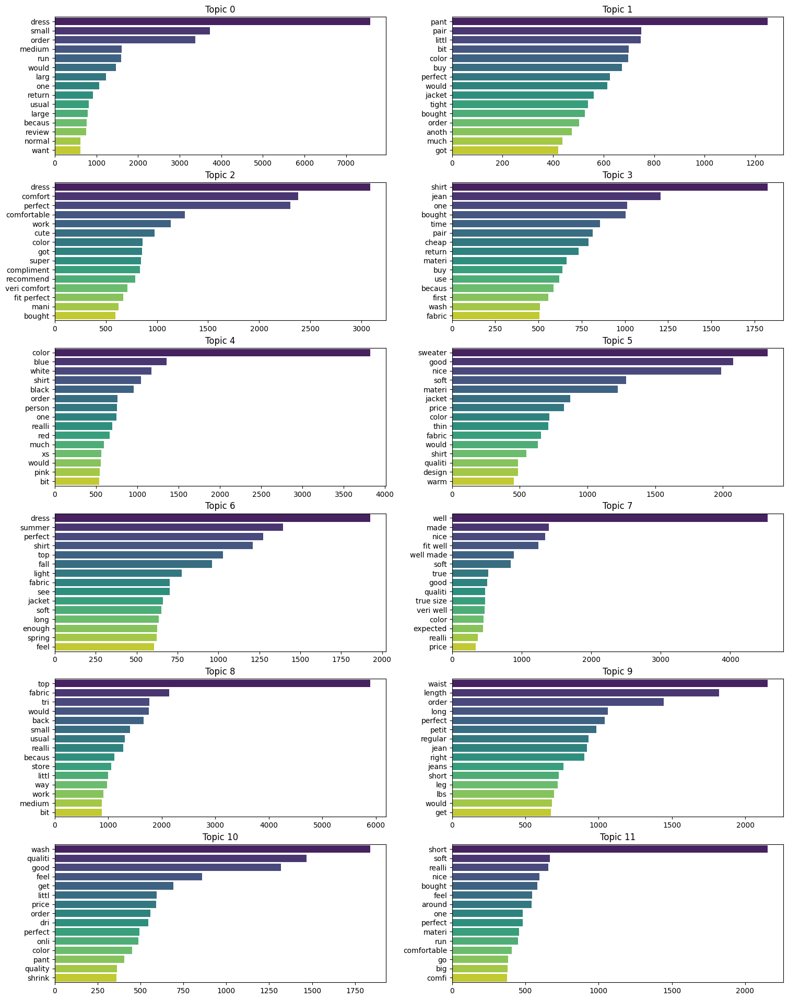

In [35]:
fig, axes = plt.subplots(6, 2, figsize = (18, 24))

n_top_words = 15

for idx, topic in enumerate(lda.components_):
    top_features_idx = topic.argsort()[-n_top_words:]
    top_features = count_vect0.get_feature_names_out()[top_features_idx]
    weights = topic[top_features_idx]
    
    sns.barplot(x = weights[::-1], 
                y = top_features[::-1], 
                palette = 'viridis', 
                orient = 'h', 
                ax = axes[idx // 2][idx % 2]
               ).set_title(f'Topic {idx}')
    
plt.show()

In [47]:
client = OpenAI(
    api_key = api_key
)

content = 'I want you to give a 1 to 5 word title to these 12 topic based on the group of words:'

In [44]:
n_top_words = 15

topic_dict = dict()

for idx, topic in enumerate(lda.components_):
    top_features_idx = topic.argsort()[-n_top_words:]
    top_features = count_vect0.get_feature_names_out()[top_features_idx]
    weights = topic[top_features_idx]
    
    topic_dict[idx] = {'top_features': top_features, 'weights': weights}
    
    content += f'Topic {idx+1}: {top_features}\n'

In [48]:
completion = client.chat.completions.create(
    model = 'gpt-3.5-turbo', 
    messages = [
        {'role': 'user', 
         'content': content}
    ],
    temperature = 0.1
)

titles = completion.choices[0].message.content.split('\n')

RateLimitError: Error code: 429 - {'error': {'message': 'You exceeded your current quota, please check your plan and billing details.', 'type': 'insufficient_quota', 'param': None, 'code': 'insufficient_quota'}}

In [ ]:
fig, axes = plt.subplots(6, 2, figsize = (18, 24))

for idx in topic_dict.keys():
    top_features = topic_dict[idx]['top_features'][::-1][:15]
    weights = topic_dict[idx]['weights'][::-1][:15]
    title = titles[idx]
    
    sns.barplot(x = weights, 
                y = top_features, 
                palette = 'viridis', 
                ax = axes[idx // 2][idx % 2]
               ).set_title(title)
    
plt.show()

In [50]:
def plot_2d_reduction(x_axis, y_axis, hue, legend_title = 'cloth class'):
    fig, ax = plt.subplots(figsize = (10, 10))
    
    sns.scatterplot(x = x_axis, y = y_axis, hue = hue, palette = 'viridis')
    
    plt.legend(bbox_to_anchor = (1.02, 1), 
               loc = 'upper left', 
               borderaxespad = 0, 
               title = legend_title
              )

    plt.show()
    
def plot_3d_reduction(data, hue):    
    fig = px.scatter_3d(
        data, x = 0, y = 1, z = 2, color = hue, 
        labels = {'0': 'Feature 1', '1': 'Feature 2', '2': 'Feature 3'}
    )

    fig.show()

In [51]:
tsvd = TruncatedSVD(n_components = 6)

tsvd_red = tsvd.fit_transform(text_all)

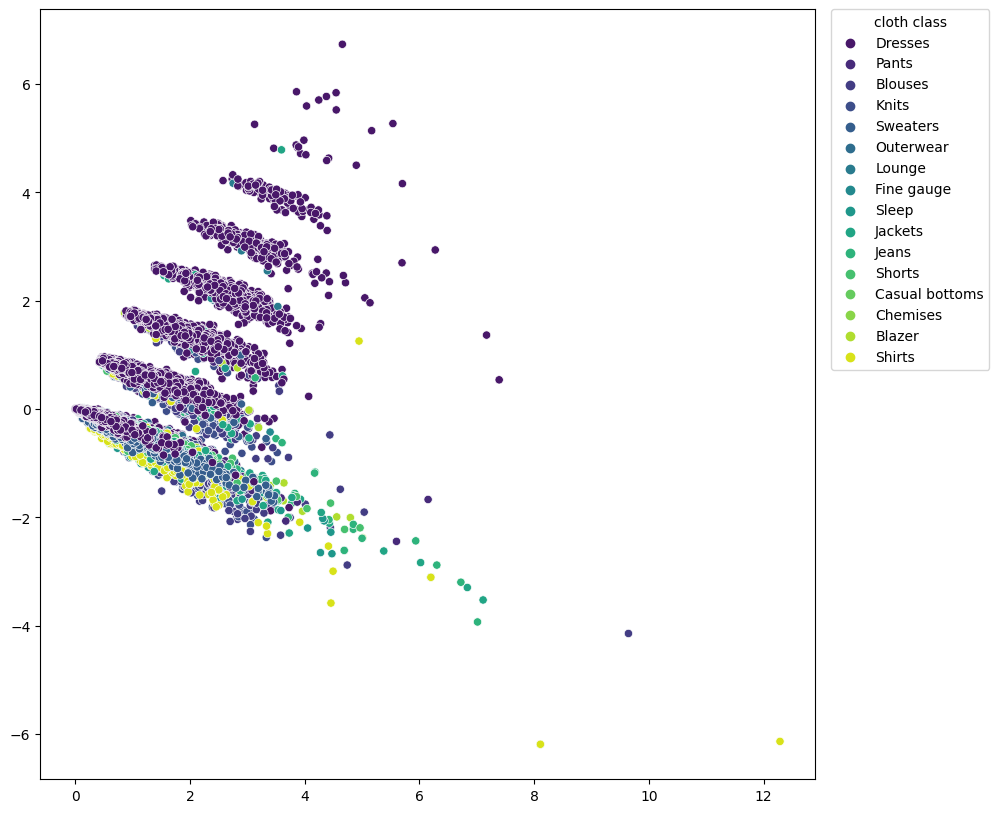

In [52]:
plot_2d_reduction(tsvd_red[:, 0], tsvd_red[:, 1], new_df['Cloth_class'])

In [53]:
plot_3d_reduction(tsvd_red, new_df['Cloth_class'])

In [54]:
tsne = TSNE(n_components = 2, n_jobs = 4)

tsne_red = tsne.fit_transform(text_all.toarray())

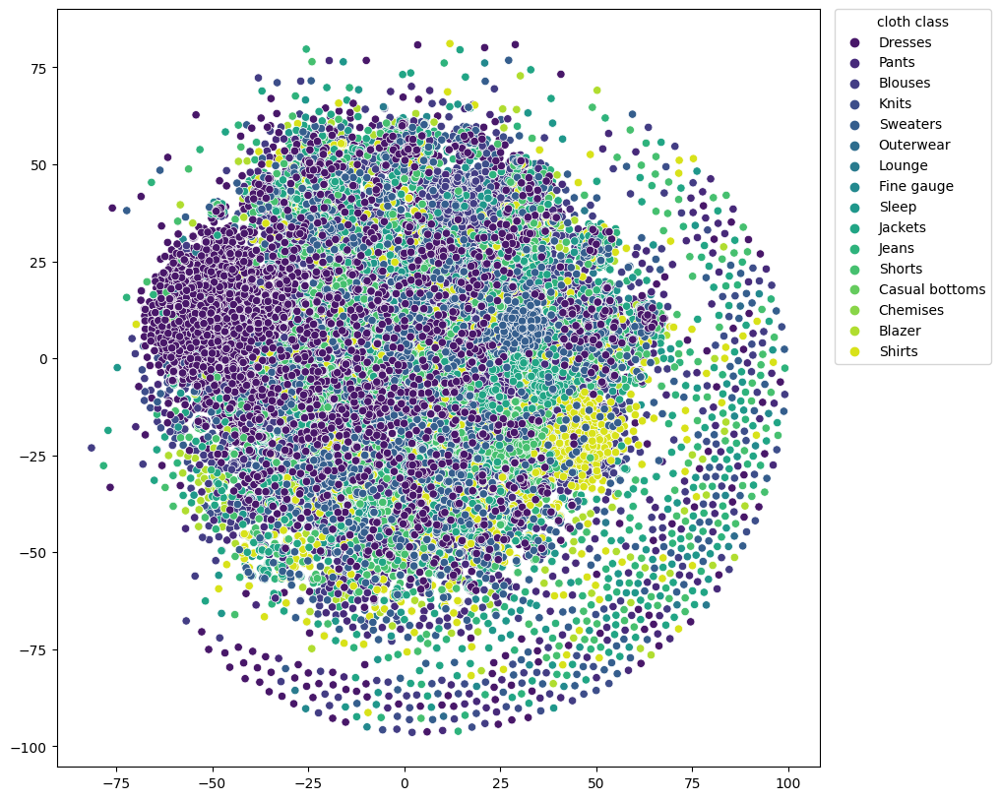

In [55]:
plot_2d_reduction(tsne_red[:, 0], tsne_red[:, 1], new_df['Cloth_class'])

In [57]:
umap_reducer = UMAP(n_components = 3, n_neighbors = 50, metric = 'cosine', min_dist = 0.25, random_state = 1)

umap_red = umap_reducer.fit_transform(text_all)

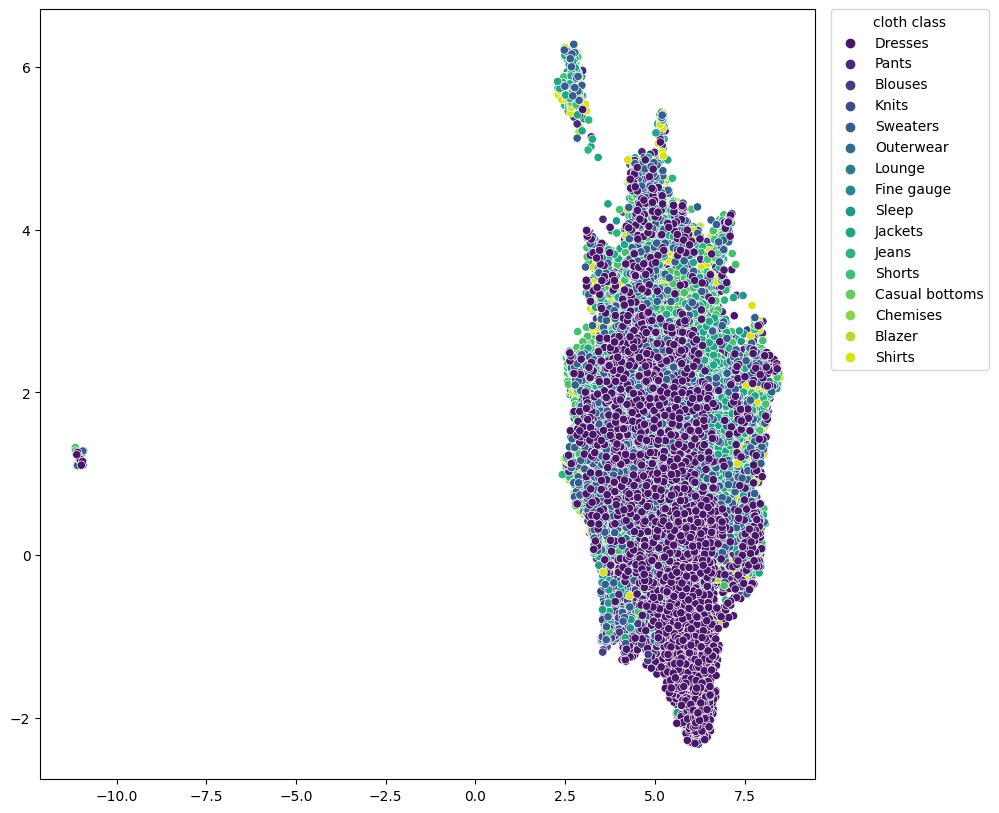

In [58]:
plot_2d_reduction(umap_red[:, 0], umap_red[:, 1], new_df['Cloth_class'])

In [59]:
plot_3d_reduction(umap_red, new_df['Cloth_class'])

In [60]:
pca = PCA(n_components = 5)

pca_red = pca.fit_transform(text_all.toarray())

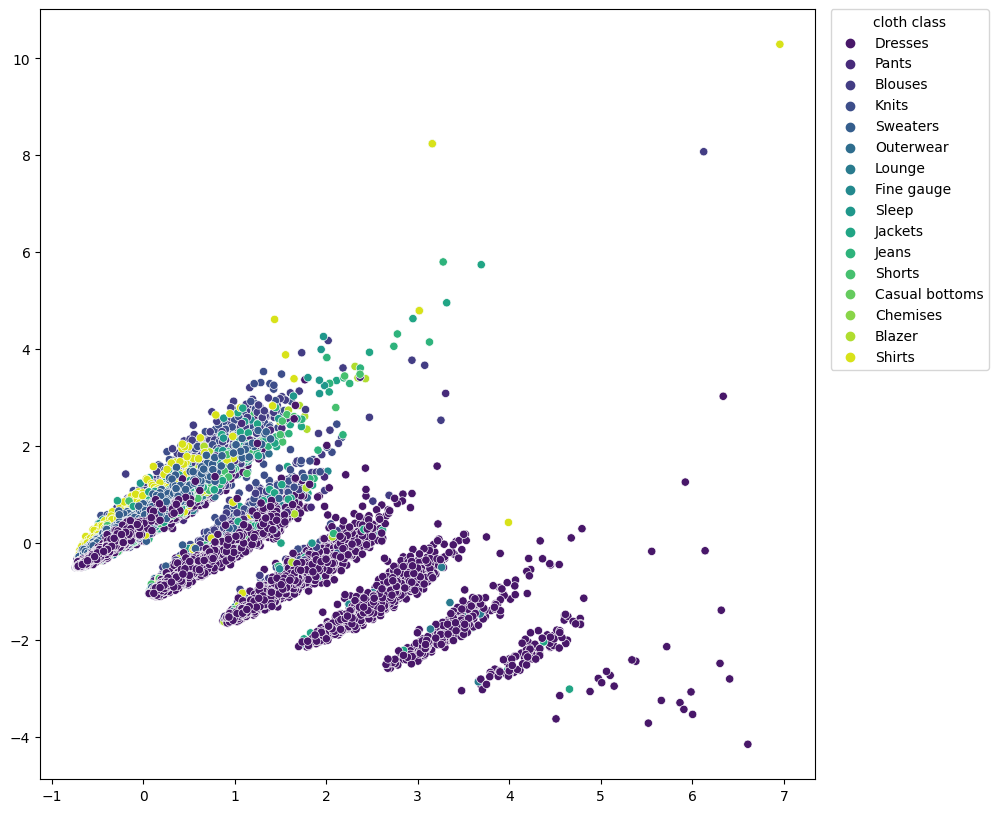

In [61]:
plot_2d_reduction(pca_red[:, 0], pca_red[:, 1], new_df['Cloth_class'])

In [62]:
plot_3d_reduction(pca_red, new_df['Cloth_class'])

In [63]:
inertias = list()
ranges = list(range(4, 20))

kmeans_models = dict()

for n in ranges:
    kmeans_n = KMeans(n_clusters = n, n_init = 124)
    
    kmeans_n.fit(umap_red)
    
    inertias.append(kmeans_n.inertia_)
    
    kmeans_models[n] = kmeans_n

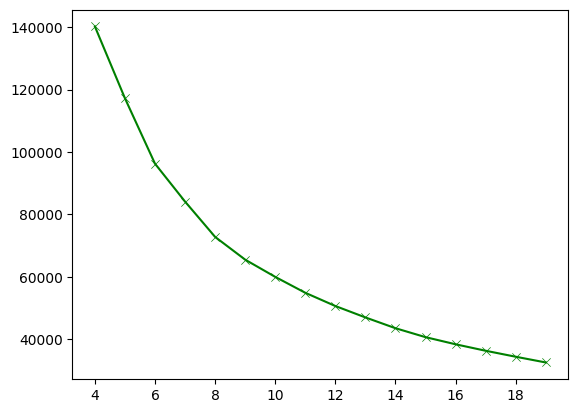

In [64]:
sns.lineplot(x = ranges, y = inertias, color = 'Green')

sns.scatterplot(x = ranges, y = inertias, color = 'Green', marker = 'x')

plt.show()

In [184]:
kmeans = KMeans(n_clusters = 8, n_init = 514, random_state = 1, max_iter = 354)

kmeans_df, total_kmeans, kmeans_cloth = cluster_results(kmeans, umap_red, new_df)

display(kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,5
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,1
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,1
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,4
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,1
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,0
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,4
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,7


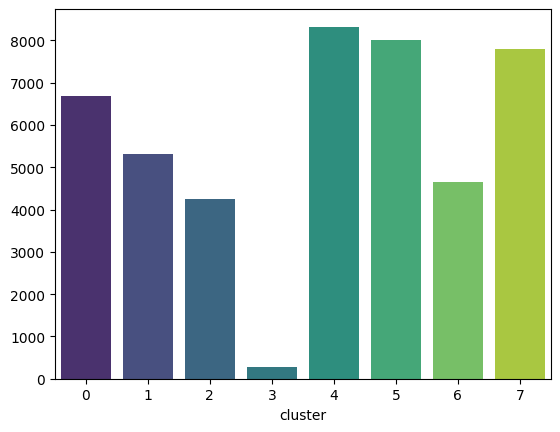

In [185]:
plot_total_cluster(total_kmeans)

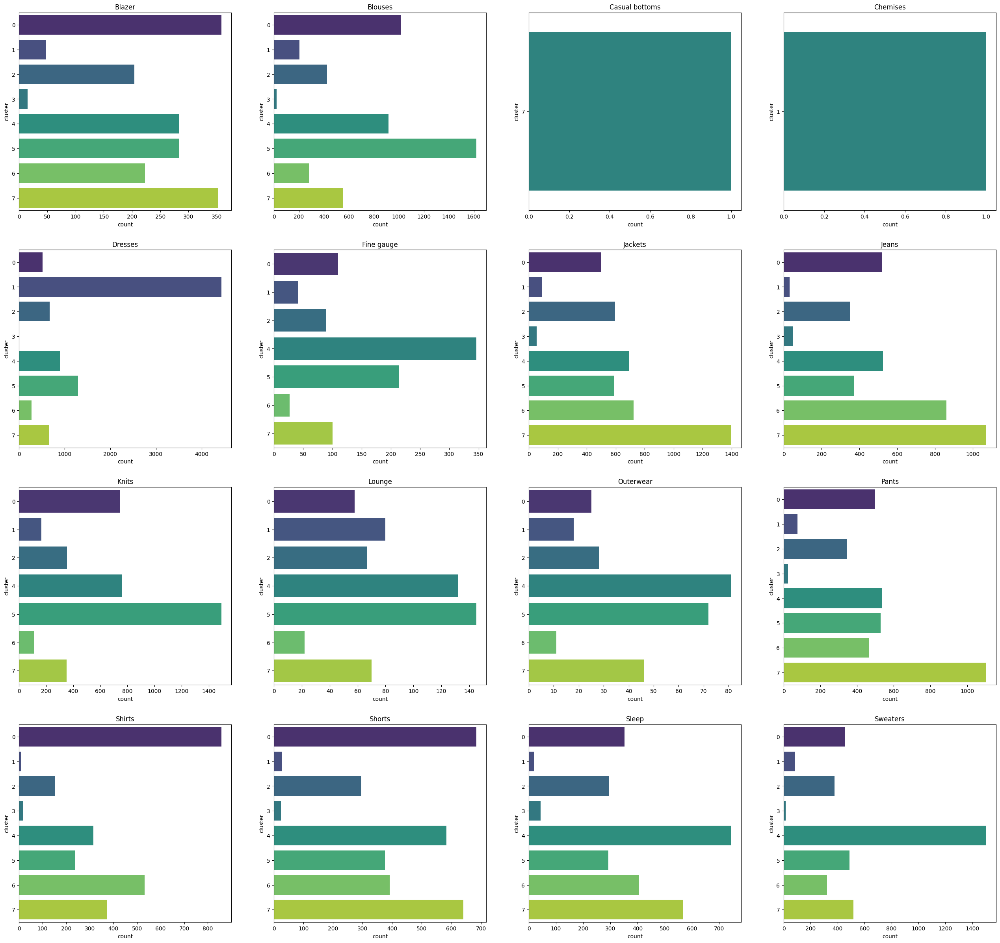

In [186]:
plot_cloth_cluster(kmeans_cloth)

(0, {'classes': ['Blazer', 'Shirts', 'Shorts'], 'max': 'Shirts', 'count': 6693})
(7, {'classes': ['Casual bottoms', 'Jackets', 'Jeans', 'Pants'], 'max': 'Jackets', 'count': 7795})
(6, {'classes': [], 'count': 4649})
(5, {'classes': ['Blouses', 'Knits', 'Lounge'], 'max': 'Blouses', 'count': 8001})
(4, {'classes': ['Fine gauge', 'Outerwear', 'Sleep', 'Sweaters'], 'max': 'Sweaters', 'count': 8322})
(3, {'classes': [], 'count': 269})
(2, {'classes': [], 'count': 4257})
(1, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 5322})


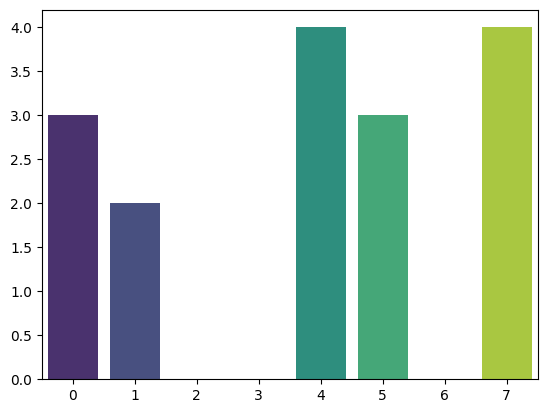

In [187]:
kmeans_dict = get_cluster_class(kmeans_cloth)

print(*kmeans_dict.items(), sep = '\n')

plot_cluster_class(kmeans_dict)

In [188]:
kmeans_replacer_map = get_replacer_class(kmeans_dict, classes_list_under, kmeans_cloth)

print(*kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jackets')
('Chemises', 'Dresses')
('Fine gauge', 'Sweaters')
('Lounge', 'Blouses')
('Outerwear', 'Sweaters')


In [140]:
kmeans = KMeans(n_clusters = 8, n_init = 514, random_state = 1, max_iter = 354)

kmeans_df, total_kmeans, kmeans_cloth = cluster_results(kmeans, tsne_red, new_df)

display(kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,4
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,3
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,3
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,5
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,3
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,3
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,3
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,2


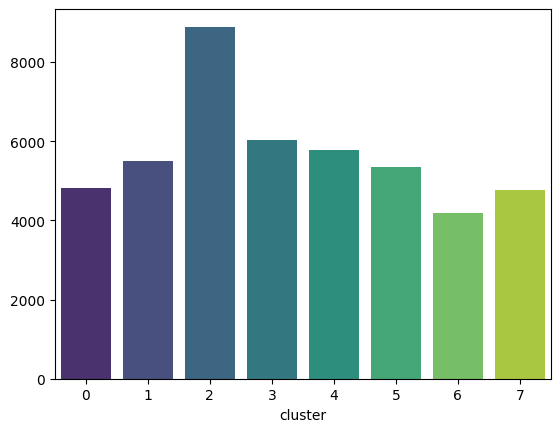

In [141]:
plot_total_cluster(total_kmeans)

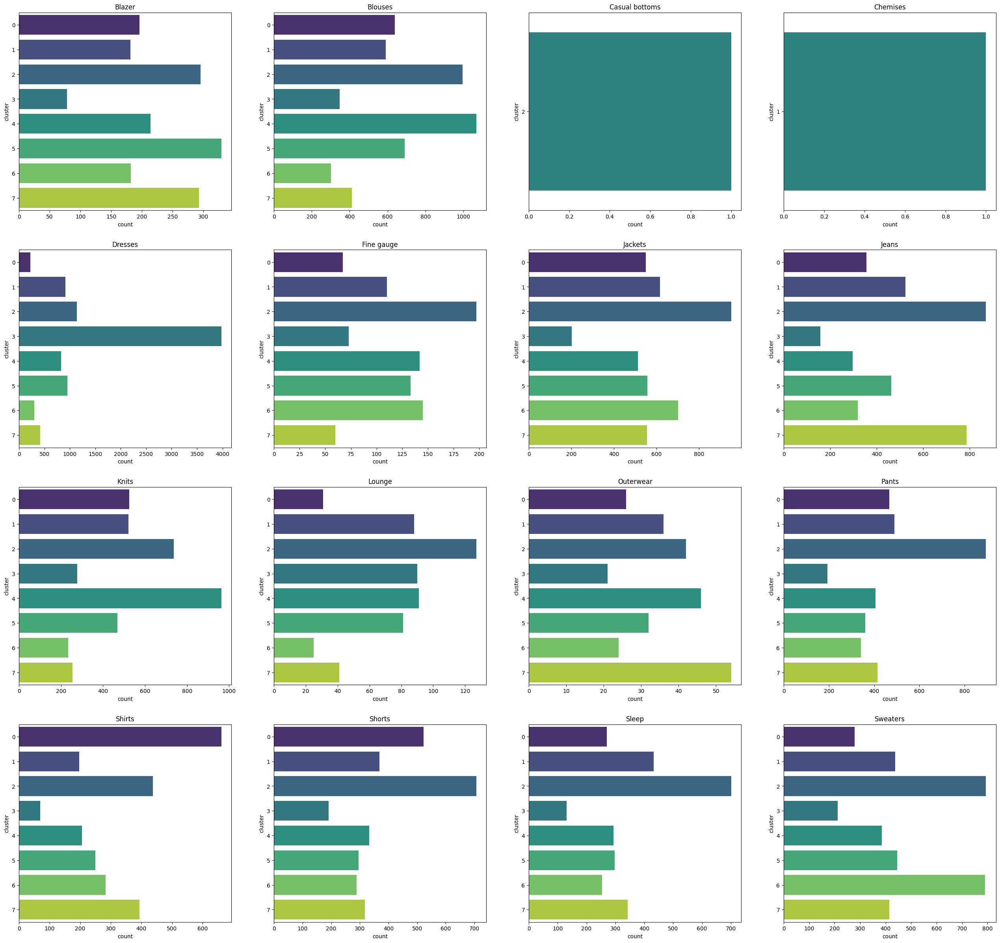

In [142]:
plot_cloth_cluster(kmeans_cloth)

(0, {'classes': ['Shirts'], 'max': 'Shirts', 'count': 4809})
(2, {'classes': ['Casual bottoms', 'Fine gauge', 'Jackets', 'Jeans', 'Lounge', 'Pants', 'Shorts', 'Sleep', 'Sweaters'], 'max': 'Jackets', 'count': 8890})
(4, {'classes': ['Blouses', 'Knits'], 'max': 'Blouses', 'count': 5784})
(5, {'classes': ['Blazer'], 'max': 'Blazer', 'count': 5351})
(1, {'classes': ['Chemises'], 'max': 'Chemises', 'count': 5507})
(7, {'classes': ['Outerwear'], 'max': 'Outerwear', 'count': 4758})
(6, {'classes': [], 'count': 4191})
(3, {'classes': ['Dresses'], 'max': 'Dresses', 'count': 6018})


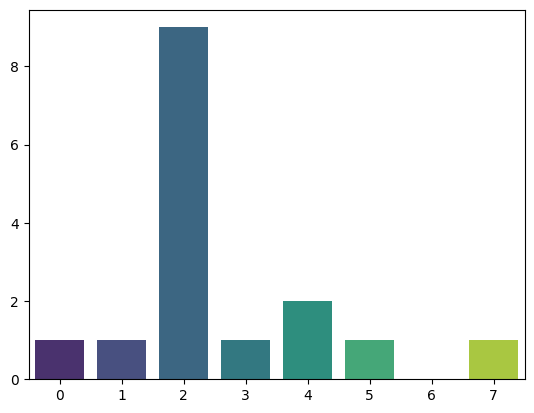

In [143]:
kmeans_dict = get_cluster_class(kmeans_cloth)

print(*kmeans_dict.items(), sep = '\n')

plot_cluster_class(kmeans_dict)

In [144]:
kmeans_replacer_map = get_replacer_class(kmeans_dict, classes_list_under, kmeans_cloth)

print(*kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jackets')
('Chemises', '-')
('Fine gauge', 'Jackets')
('Lounge', 'Jackets')
('Outerwear', '-')


In [145]:
kmeans = KMeans(n_clusters = 8, n_init = 514, random_state = 1, max_iter = 354)

kmeans_df, total_kmeans, kmeans_cloth = cluster_results(kmeans, pca_red, new_df)

display(kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,3
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,0
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,2
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,1
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,6
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,5
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,5
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,5
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0


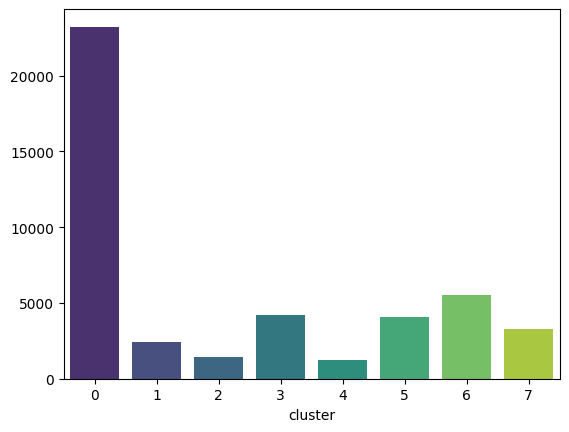

In [146]:
plot_total_cluster(total_kmeans)

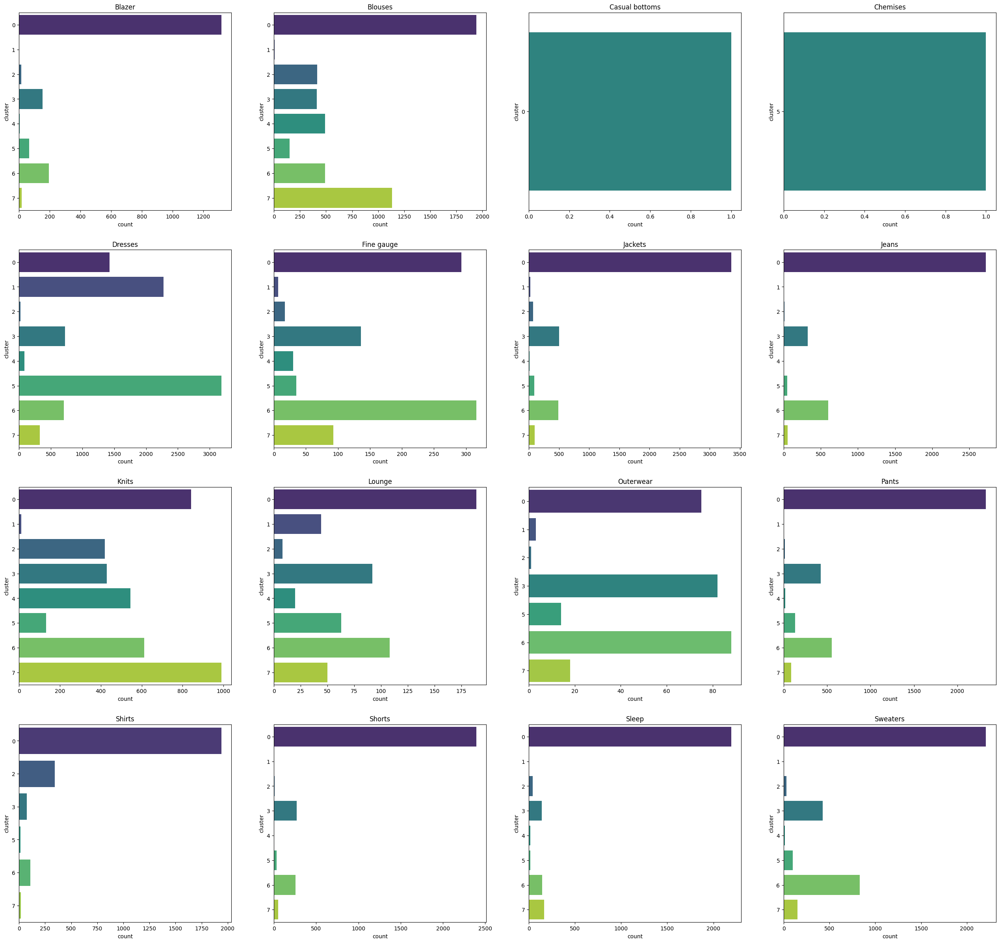

In [147]:
plot_cloth_cluster(kmeans_cloth)

(0, {'classes': ['Blazer', 'Blouses', 'Casual bottoms', 'Jackets', 'Jeans', 'Lounge', 'Pants', 'Shirts', 'Shorts', 'Sleep', 'Sweaters'], 'max': 'Jackets', 'count': 23228})
(2, {'classes': [], 'count': 1423})
(6, {'classes': ['Fine gauge', 'Outerwear'], 'max': 'Fine gauge', 'count': 5497})
(1, {'classes': [], 'count': 2396})
(7, {'classes': ['Knits'], 'max': 'Knits', 'count': 3249})
(4, {'classes': [], 'count': 1240})
(5, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 4083})
(3, {'classes': [], 'count': 4192})


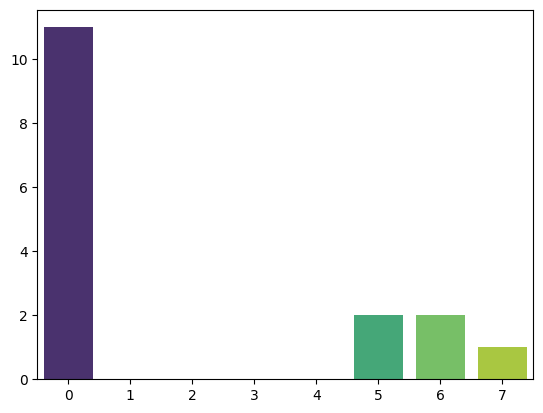

In [148]:
kmeans_dict = get_cluster_class(kmeans_cloth)

print(*kmeans_dict.items(), sep = '\n')

plot_cluster_class(kmeans_dict)

In [149]:
kmeans_replacer_map = get_replacer_class(kmeans_dict, classes_list_under, kmeans_cloth)

print(*kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jackets')
('Chemises', 'Dresses')
('Fine gauge', '-')
('Lounge', 'Jackets')
('Outerwear', '-')


In [150]:
kmeans = KMeans(n_clusters = 8, n_init = 514, random_state = 1, max_iter = 354)

kmeans_df, total_kmeans, kmeans_cloth = cluster_results(kmeans, tsvd_red, new_df)

display(kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,5
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,0
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,7
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,6
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,4
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,2
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,2
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,2
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0


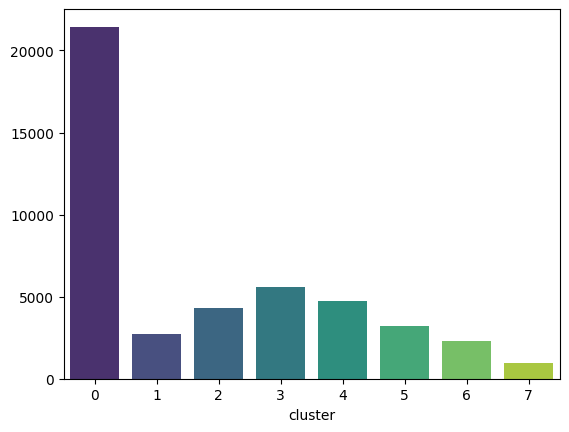

In [151]:
plot_total_cluster(total_kmeans)

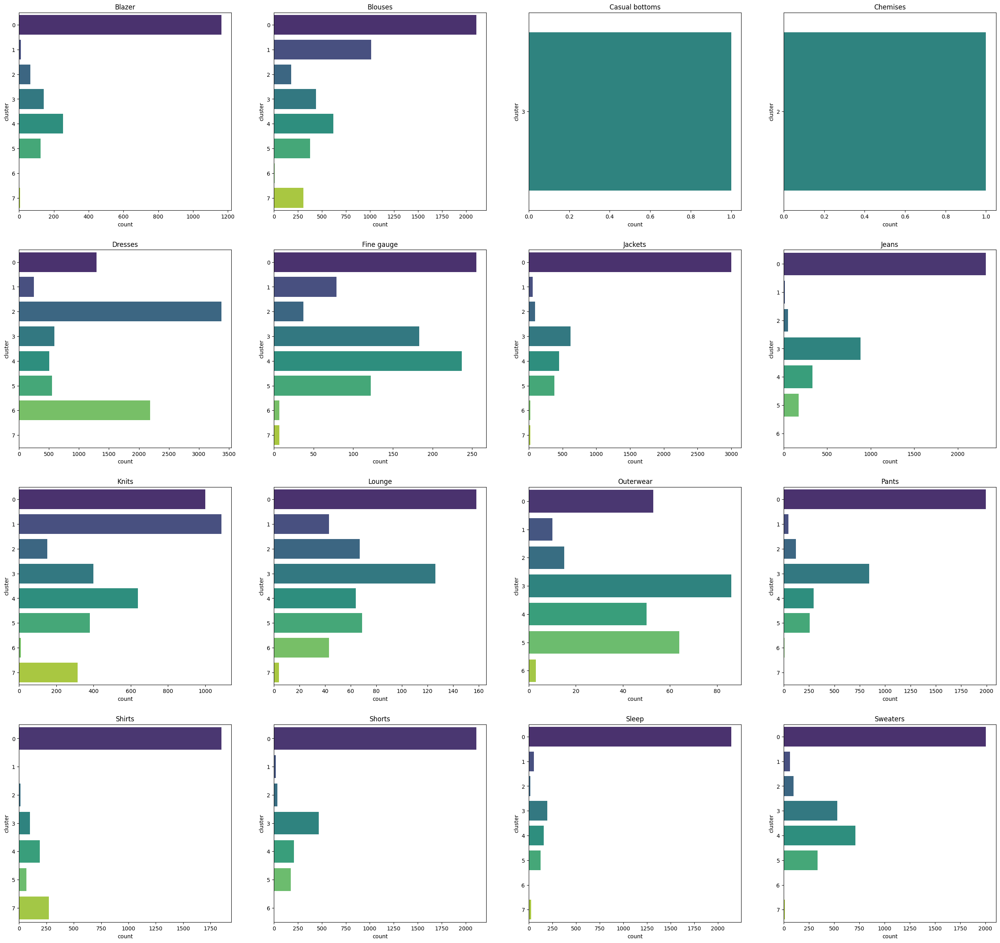

In [152]:
plot_cloth_cluster(kmeans_cloth)

(0, {'classes': ['Blazer', 'Blouses', 'Fine gauge', 'Jackets', 'Jeans', 'Lounge', 'Pants', 'Shirts', 'Shorts', 'Sleep', 'Sweaters'], 'max': 'Jackets', 'count': 21448})
(4, {'classes': [], 'count': 4715})
(3, {'classes': ['Casual bottoms', 'Outerwear'], 'max': 'Outerwear', 'count': 5610})
(7, {'classes': [], 'count': 979})
(6, {'classes': [], 'count': 2299})
(2, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 4319})
(1, {'classes': ['Knits'], 'max': 'Knits', 'count': 2746})
(5, {'classes': [], 'count': 3192})


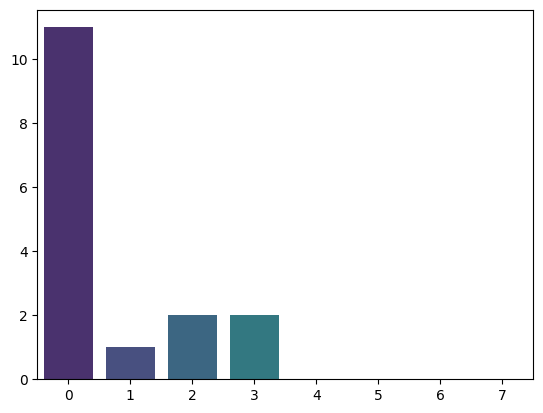

In [153]:
kmeans_dict = get_cluster_class(kmeans_cloth)

print(*kmeans_dict.items(), sep = '\n')

plot_cluster_class(kmeans_dict)

In [154]:
kmeans_replacer_map = get_replacer_class(kmeans_dict, classes_list_under, kmeans_cloth)

print(*kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', '-')
('Chemises', 'Dresses')
('Fine gauge', 'Jackets')
('Lounge', 'Jackets')
('Outerwear', '-')


In [155]:
agg_cluster = AgglomerativeClustering(n_clusters = 8)

agg_cluster_df, total_agg_cluster, agg_cluster_cloth = cluster_results(agg_cluster, umap_red, new_df)

display(agg_cluster_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,2
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,4
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,5
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,4
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,4
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,0
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,4
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0


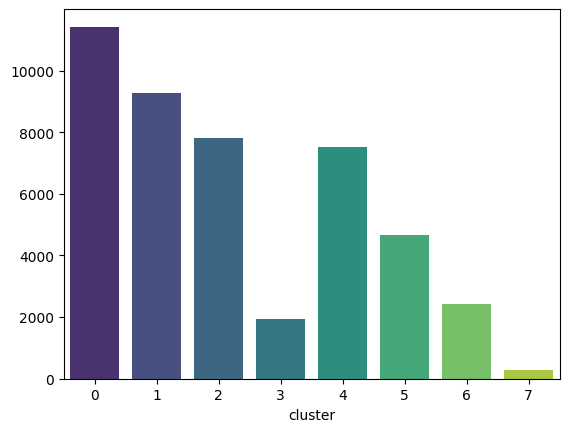

In [156]:
plot_total_cluster(total_agg_cluster)

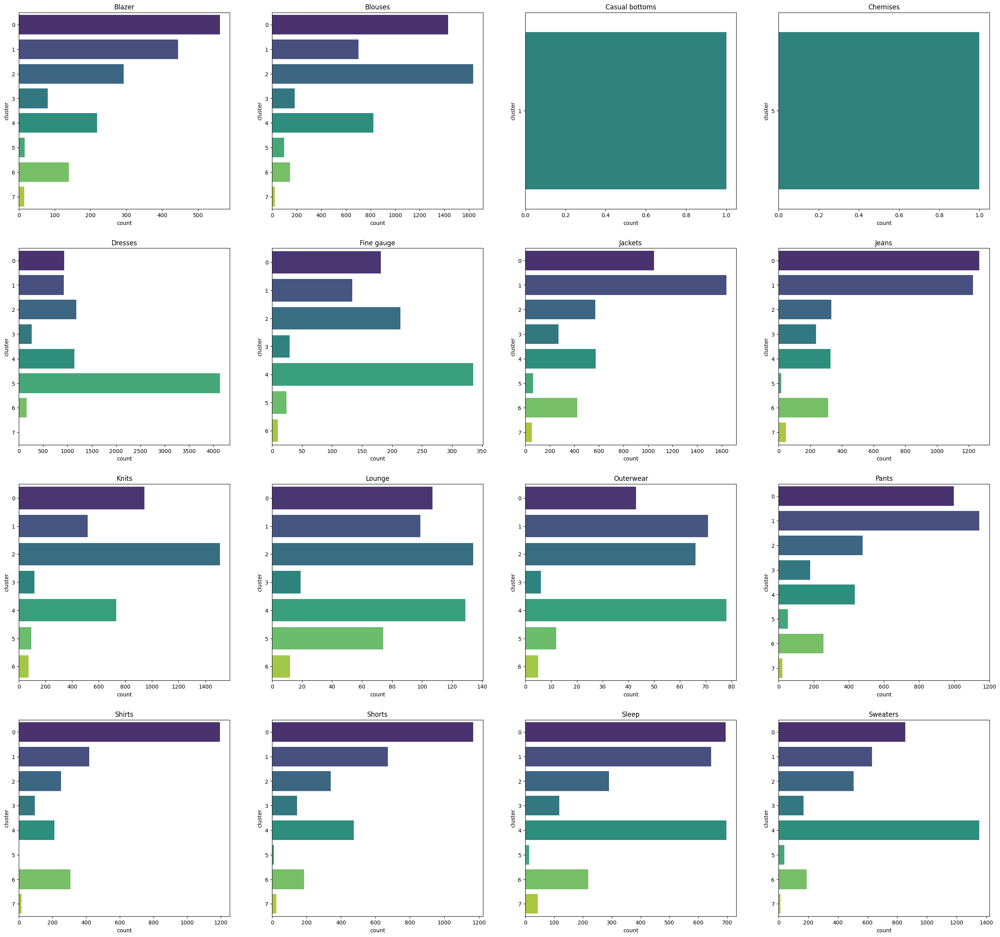

In [157]:
plot_cloth_cluster(agg_cluster_cloth)

(0, {'classes': ['Blazer', 'Jeans', 'Shirts', 'Shorts'], 'max': 'Jeans', 'count': 11424})
(5, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 4649})
(4, {'classes': ['Fine gauge', 'Outerwear', 'Sleep', 'Sweaters'], 'max': 'Sweaters', 'count': 7534})
(6, {'classes': [], 'count': 2439})
(7, {'classes': [], 'count': 269})
(2, {'classes': ['Blouses', 'Knits', 'Lounge'], 'max': 'Blouses', 'count': 7799})
(1, {'classes': ['Casual bottoms', 'Jackets', 'Pants'], 'max': 'Jackets', 'count': 9271})
(3, {'classes': [], 'count': 1923})


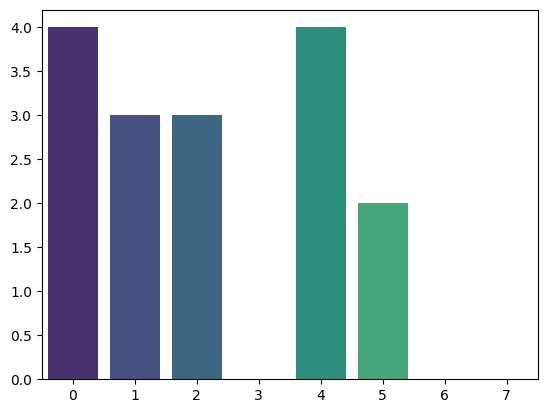

In [158]:
agg_cluster_dict = get_cluster_class(agg_cluster_cloth)

print(*agg_cluster_dict.items(), sep = '\n')

plot_cluster_class(agg_cluster_dict)

In [159]:
agg_cluster_replacer_map = get_replacer_class(agg_cluster_dict, classes_list_under, agg_cluster_cloth)

print(*agg_cluster_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jackets')
('Chemises', 'Dresses')
('Fine gauge', 'Sweaters')
('Lounge', 'Blouses')
('Outerwear', 'Sweaters')


In [160]:
agg_cluster = AgglomerativeClustering(n_clusters = 8)

agg_cluster_df, total_agg_cluster, agg_cluster_cloth = cluster_results(agg_cluster, tsvd_red, new_df)#cluster_results(agg_cluster, tsne_red, clean_df)

display(agg_cluster_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,0
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,3
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,4
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,5
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,6
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,1
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,1
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,1
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,3


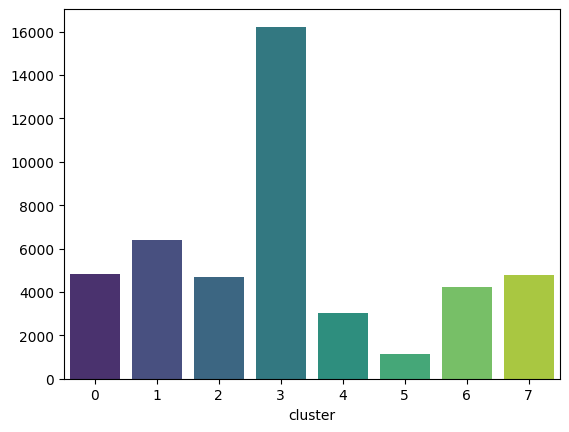

In [161]:
plot_total_cluster(total_agg_cluster)

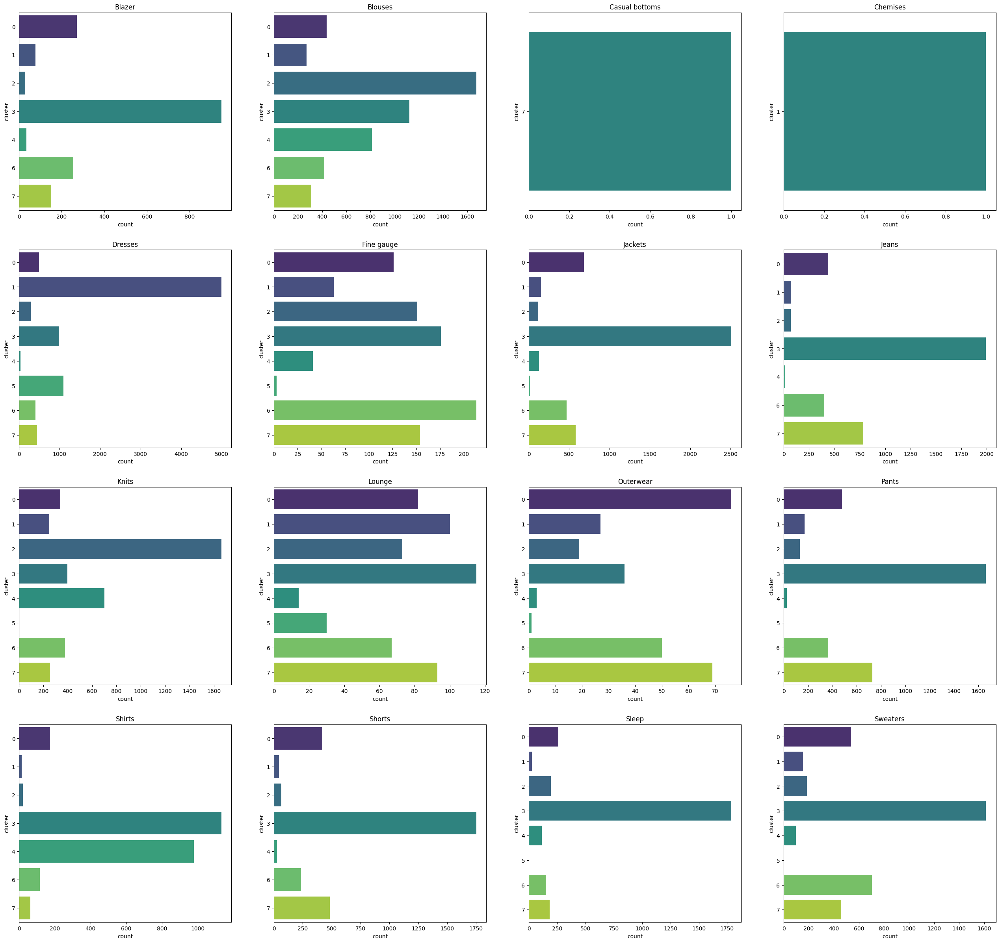

In [162]:
plot_cloth_cluster(agg_cluster_cloth)

(0, {'classes': ['Outerwear'], 'max': 'Outerwear', 'count': 4818})
(6, {'classes': ['Fine gauge'], 'max': 'Fine gauge', 'count': 4227})
(7, {'classes': ['Casual bottoms'], 'max': 'Casual bottoms', 'count': 4760})
(4, {'classes': [], 'count': 3032})
(2, {'classes': ['Blouses', 'Knits'], 'max': 'Blouses', 'count': 4681})
(1, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 6412})
(3, {'classes': ['Blazer', 'Jackets', 'Jeans', 'Lounge', 'Pants', 'Shirts', 'Shorts', 'Sleep', 'Sweaters'], 'max': 'Jackets', 'count': 16229})
(5, {'classes': [], 'count': 1149})


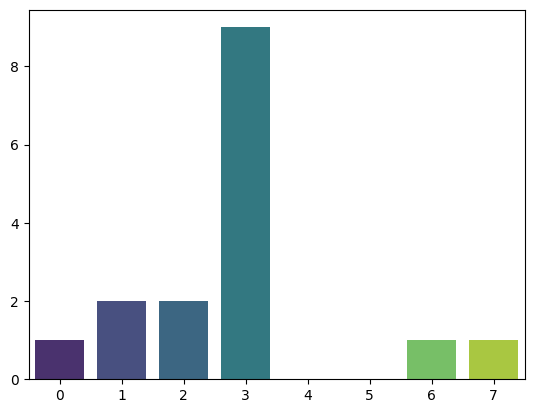

In [163]:
agg_cluster_dict = get_cluster_class(agg_cluster_cloth)

print(*agg_cluster_dict.items(), sep = '\n')

plot_cluster_class(agg_cluster_dict)

In [164]:
agg_cluster_replacer_map = get_replacer_class(agg_cluster_dict, classes_list_under, agg_cluster_cloth)

print(*agg_cluster_replacer_map.items(), sep = '\n')

('Casual bottoms', '-')
('Chemises', 'Dresses')
('Fine gauge', '-')
('Lounge', 'Jackets')
('Outerwear', '-')


In [165]:
dbscan = DBSCAN(metric = 'cosine', n_jobs = 4, eps = 1)

dbscan_df, total_dbscan, dbscan_cloth = cluster_results(dbscan, umap_red, new_df)

display(dbscan_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,0
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,0
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,0
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,0
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,0
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,0
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,0
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0


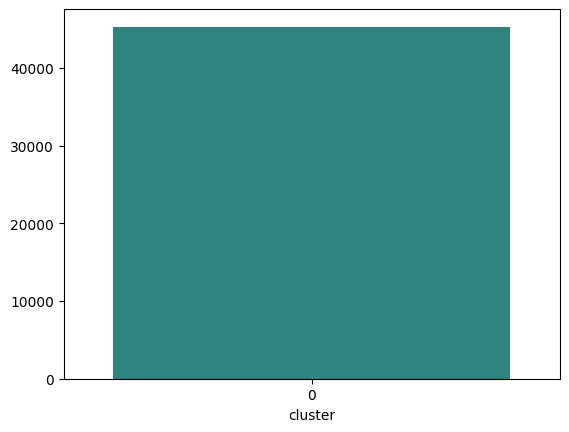

In [166]:
plot_total_cluster(total_dbscan)

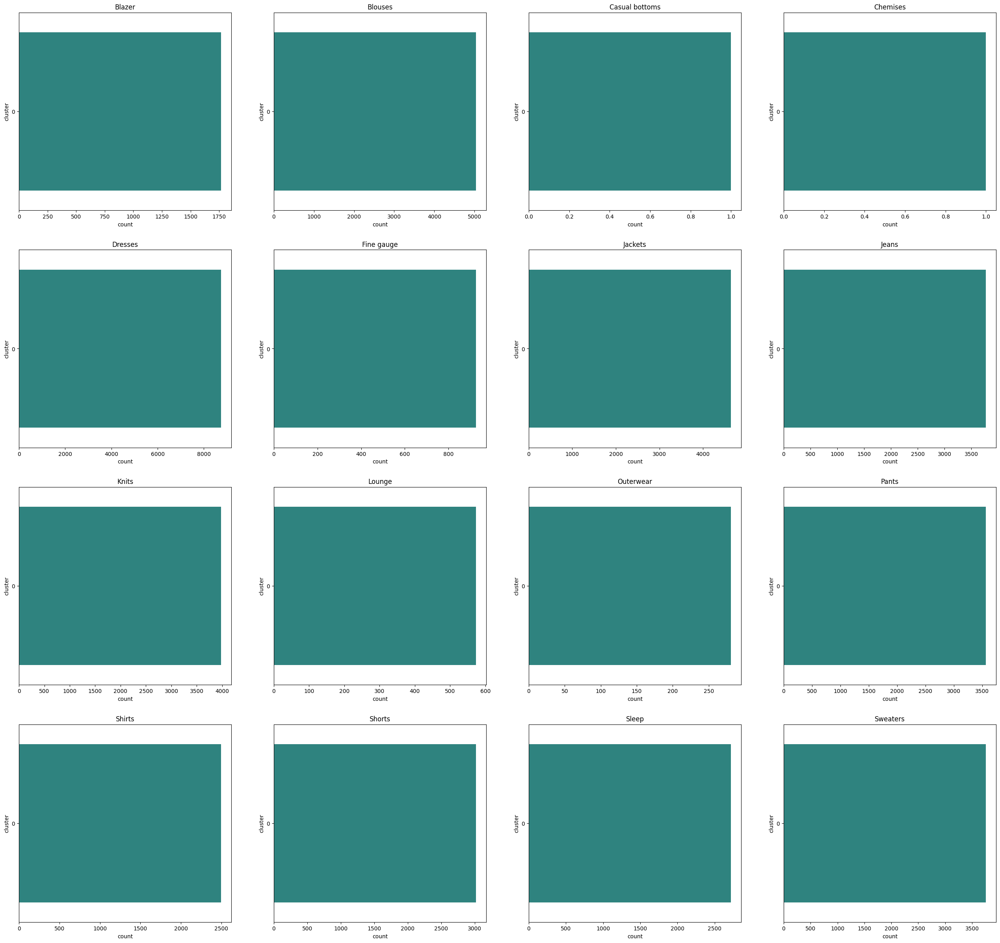

In [167]:
plot_cloth_cluster(dbscan_cloth)

In [168]:
mini_batch = MiniBatchKMeans(n_clusters = 6, n_init = 504, random_state = 1)

mini_batch_df, total_mini_batch, mini_batch_cloth = cluster_results(mini_batch, umap_red, new_df)

display(mini_batch_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,2
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,3
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,4
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,3
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,2
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,3
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,5
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,1
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,5


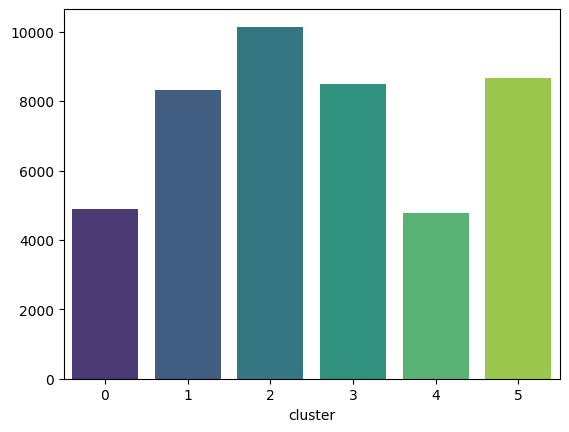

In [169]:
plot_total_cluster(total_mini_batch)

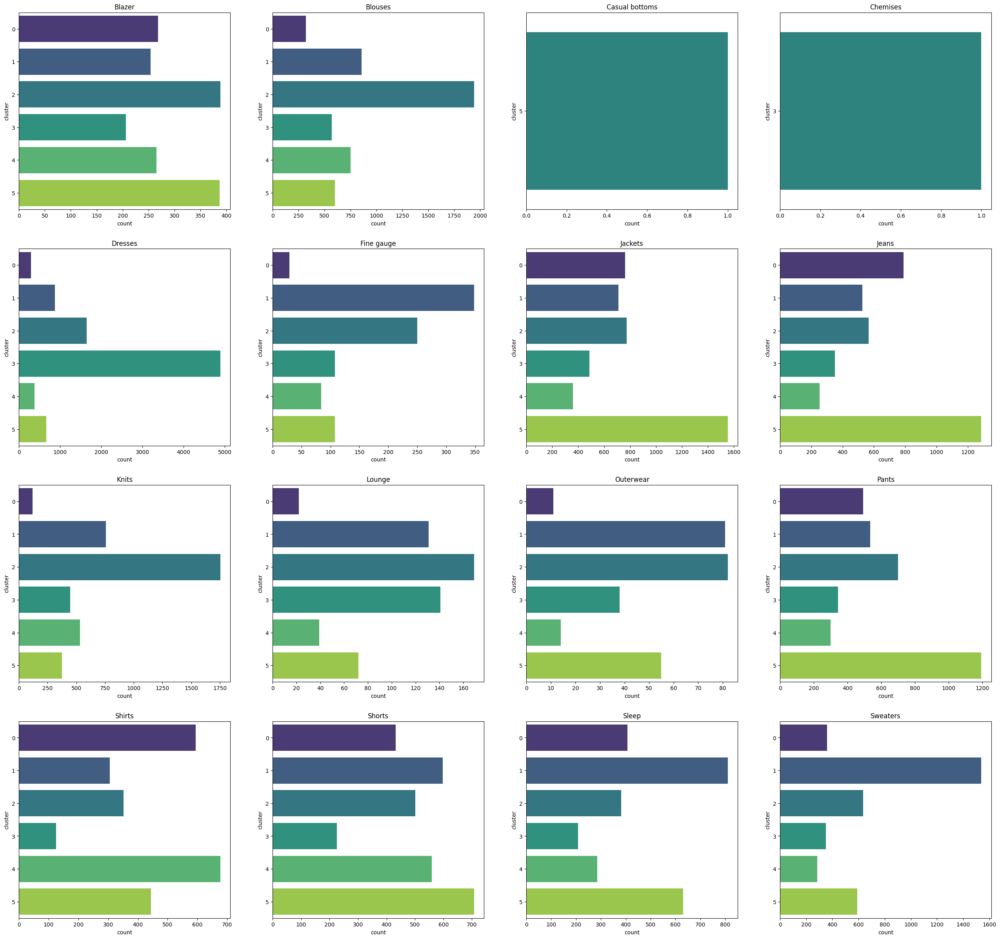

In [170]:
plot_cloth_cluster(mini_batch_cloth)

(0, {'classes': [], 'count': 4902})
(5, {'classes': ['Casual bottoms', 'Jackets', 'Jeans', 'Pants', 'Shorts'], 'max': 'Jackets', 'count': 8671})
(4, {'classes': ['Shirts'], 'max': 'Shirts', 'count': 4776})
(2, {'classes': ['Blazer', 'Blouses', 'Knits', 'Lounge', 'Outerwear'], 'max': 'Blouses', 'count': 10144})
(1, {'classes': ['Fine gauge', 'Sleep', 'Sweaters'], 'max': 'Sweaters', 'count': 8324})
(3, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 8491})


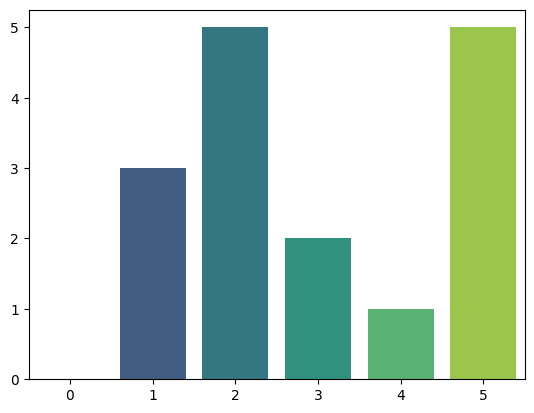

In [171]:
mini_batch_dict = get_cluster_class(mini_batch_cloth)

print(*mini_batch_dict.items(), sep = '\n')

plot_cluster_class(mini_batch_dict)

In [172]:
mini_batch_replacer_map = get_replacer_class(mini_batch_dict, classes_list_under, mini_batch_cloth)

print(*kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', '-')
('Chemises', 'Dresses')
('Fine gauge', 'Jackets')
('Lounge', 'Jackets')
('Outerwear', '-')


In [173]:
bisect_kmeans = BisectingKMeans(n_clusters = 7, 
                                init = 'k-means++', 
                                n_init  = 24, 
                                random_state = 1
                               )

bisect_kmeans_df, total_bisect_kmeans, bisect_kmeans_cloth = cluster_results(bisect_kmeans, umap_red, new_df)

display(bisect_kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,4
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,6
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,2
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,5
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,5
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,6
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,1
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,4
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,1


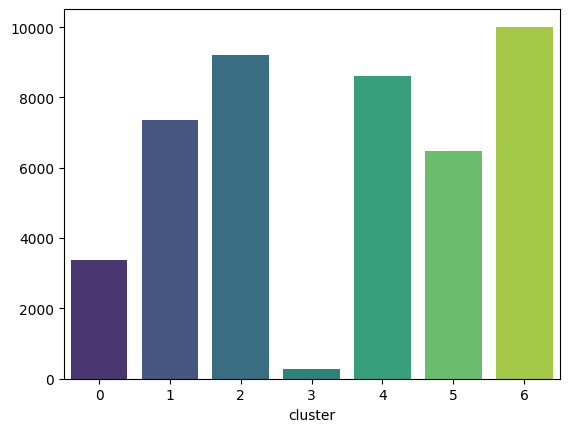

In [174]:
plot_total_cluster(total_bisect_kmeans)

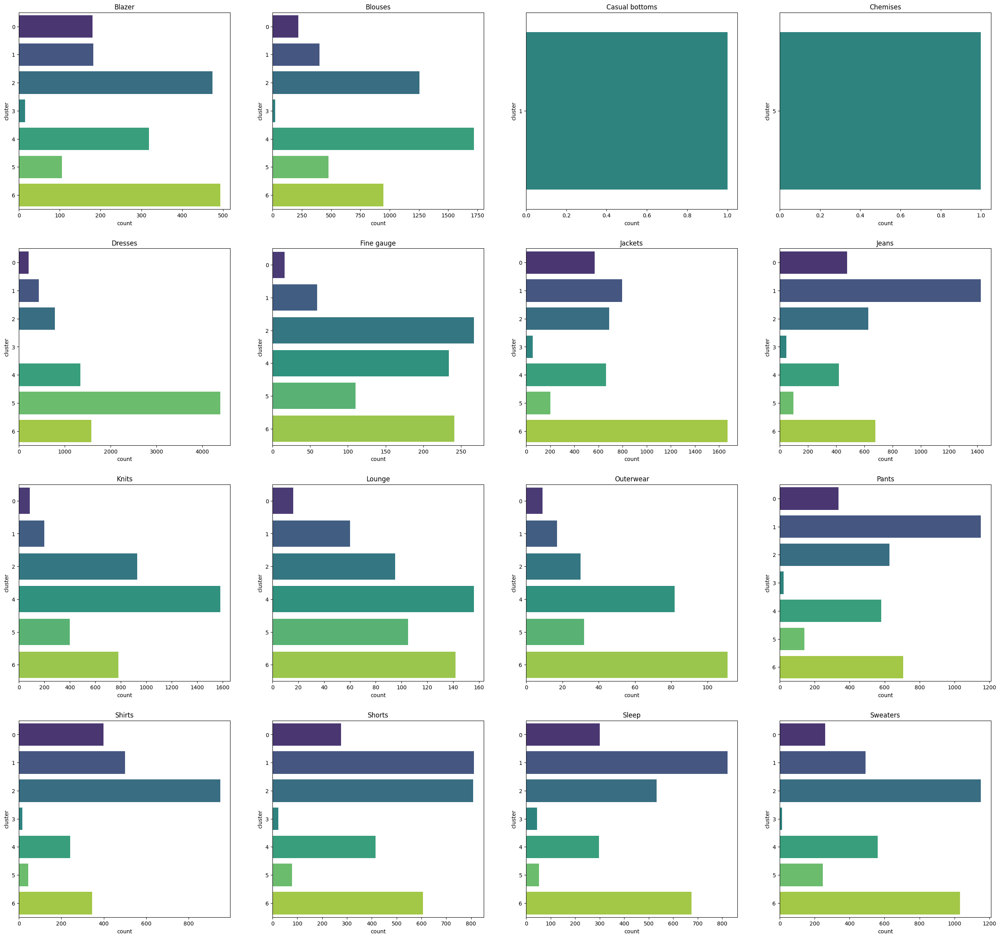

In [175]:
plot_cloth_cluster(bisect_kmeans_cloth)

(0, {'classes': [], 'count': 3365})
(4, {'classes': ['Blouses', 'Knits', 'Lounge'], 'max': 'Blouses', 'count': 8606})
(2, {'classes': ['Fine gauge', 'Shirts', 'Sweaters'], 'max': 'Sweaters', 'count': 9219})
(5, {'classes': ['Chemises', 'Dresses'], 'max': 'Dresses', 'count': 6485})
(1, {'classes': ['Casual bottoms', 'Jeans', 'Pants', 'Shorts', 'Sleep'], 'max': 'Jeans', 'count': 7352})
(6, {'classes': ['Blazer', 'Jackets', 'Outerwear'], 'max': 'Jackets', 'count': 10012})
(3, {'classes': [], 'count': 269})


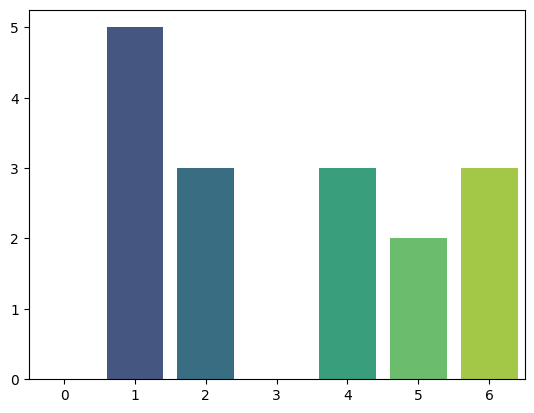

In [176]:
bisect_kmeans_dict = get_cluster_class(bisect_kmeans_cloth)

print(*bisect_kmeans_dict.items(), sep = '\n')

plot_cluster_class(bisect_kmeans_dict)

In [177]:
bisect_kmeans_replacer_map = get_replacer_class(bisect_kmeans_dict, classes_list_under, bisect_kmeans_cloth)

print(*bisect_kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jeans')
('Chemises', 'Dresses')
('Fine gauge', 'Sweaters')
('Lounge', 'Blouses')
('Outerwear', 'Jackets')


In [178]:
bisect_kmeans = BisectingKMeans(n_clusters = 7, 
                                init = 'k-means++', 
                                n_init  = 24, 
                                random_state = 1
                               )

bisect_kmeans_df, total_bisect_kmeans, bisect_kmeans_cloth = cluster_results(bisect_kmeans, tsvd_red, new_df)

display(bisect_kmeans_df)

,Title,Review,Cons_rating,Cloth_class,cluster
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses,6
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants,0
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses,0
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses,6
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits,4
...,...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses,1
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses,0
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses,0
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses,0


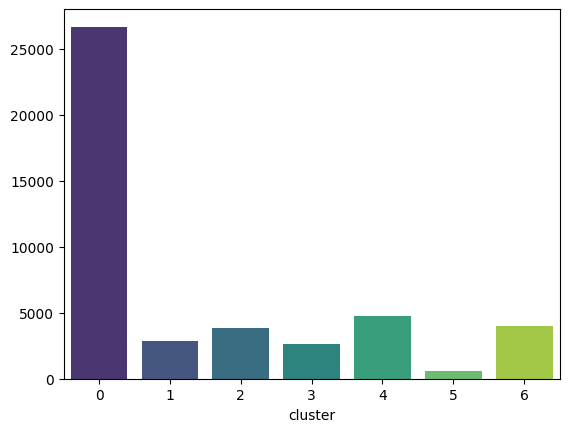

In [179]:
plot_total_cluster(total_bisect_kmeans)

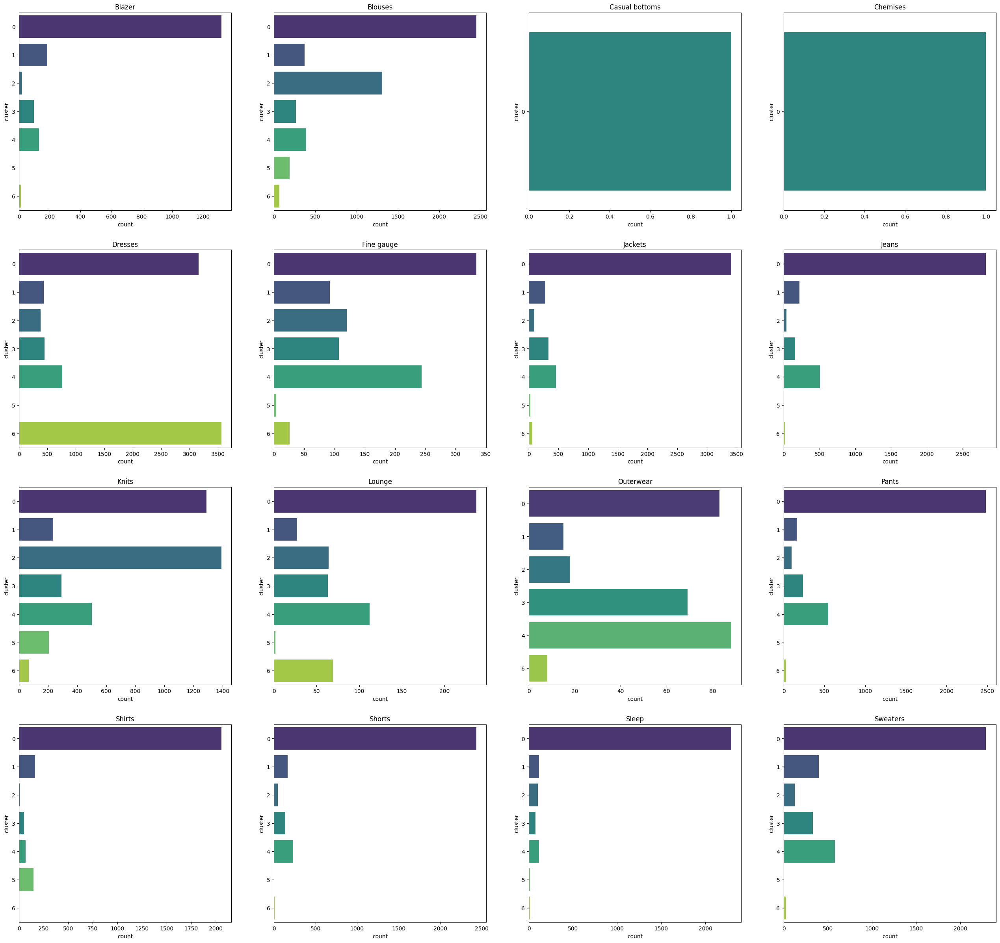

In [180]:
plot_cloth_cluster(bisect_kmeans_cloth)

(0, {'classes': ['Blazer', 'Blouses', 'Casual bottoms', 'Chemises', 'Fine gauge', 'Jackets', 'Jeans', 'Lounge', 'Pants', 'Shirts', 'Shorts', 'Sleep', 'Sweaters'], 'max': 'Jackets', 'count': 26659})
(2, {'classes': ['Knits'], 'max': 'Knits', 'count': 3819})
(4, {'classes': ['Outerwear'], 'max': 'Outerwear', 'count': 4734})
(5, {'classes': [], 'count': 603})
(1, {'classes': [], 'count': 2866})
(6, {'classes': ['Dresses'], 'max': 'Dresses', 'count': 3961})
(3, {'classes': [], 'count': 2666})


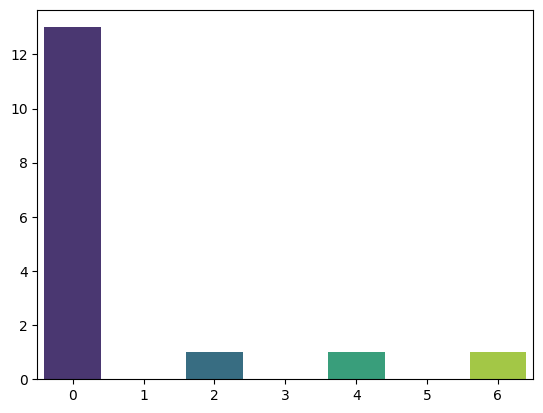

In [181]:
bisect_kmeans_dict = get_cluster_class(bisect_kmeans_cloth)

print(*bisect_kmeans_dict.items(), sep = '\n')

plot_cluster_class(bisect_kmeans_dict)

In [182]:
bisect_kmeans_replacer_map = get_replacer_class(bisect_kmeans_dict, classes_list_under, bisect_kmeans_cloth)

print(*bisect_kmeans_replacer_map.items(), sep = '\n')

('Casual bottoms', 'Jackets')
('Chemises', 'Jackets')
('Fine gauge', 'Jackets')
('Lounge', 'Jackets')
('Outerwear', '-')


In [189]:
kmeans_replacer_map

{'Casual bottoms': 'Jackets',
 'Chemises': 'Dresses',
 'Fine gauge': 'Sweaters',
 'Lounge': 'Blouses',
 'Outerwear': 'Sweaters'}

In [194]:
exported_df = new_df.copy()

replacer = lambda x: kmeans_replacer_map.get(x) or x

exported_df['Cloth_class'] = exported_df['Cloth_class'].apply(replacer)

display(exported_df)

,Title,Review,Cons_rating,Cloth_class
2,Some major design flaws,I had such high hopes for this dress and reall...,3.0,Dresses
3,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5.0,Pants
4,Flattering shirt,This shirt is very flattering to all due to th...,5.0,Blouses
5,Not for the very petite,"I love tracy reese dresses, but this one is no...",2.0,Dresses
6,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5.0,Knits
...,...,...,...,...
49333,Dress felt and fit great. I got lots of compl...,Loved the color!!! Dress fit great and I got ...,5.0,Dresses
49334,Loved the dress but poor quality,This dress looked great and I loved the materi...,2.0,Dresses
49335,"Cute dress, didn't fit",Wanted this dress to work it didn't. It is ver...,1.0,Dresses
49336,Very cute!,No complaints othe than the zipper gets stuck ...,4.0,Dresses


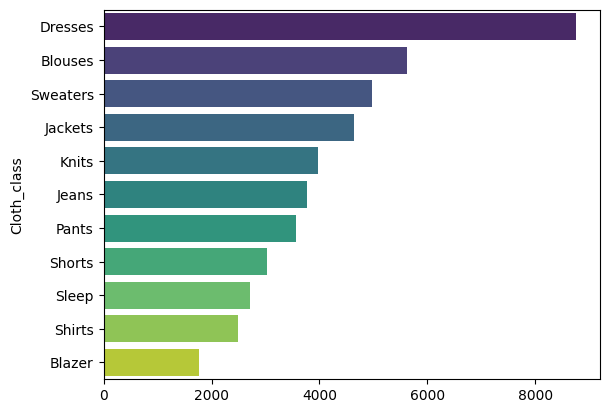

In [195]:
exported_classes_count = exported_df['Cloth_class'].value_counts()

sns.barplot(
    x = exported_classes_count.values, 
    y = exported_classes_count.index,
    palette = 'viridis',
    orient = 'h'
)

plt.show()

In [196]:
exported_df.to_csv('reviews.csv')